# Draft inequality simulations

All simulations use a slightly modified yard sale model. In a yard sale model, all actors start out with equal wealth. Each cycle, the following occurs:

* 2 random actors are picked

* The 20% of the wealth of the poorest actor is calculated. If both are equally rich, 20% of the wealth of 1 actor is calculated. This is the amount of wealth transfer that will take place.

* A fair coin flip determines whether wealth is transferred from actor 1 to actor 2 or vice versa.

* Wealth is transferred.

In [1]:
using EconoSim
using MoneySim

## 1 Standard simulation

In [2]:
df = run_standard_yard_sale_simulation(sim_length = 5000)
dfa = analyse_wealth(df)
plot_wealth(dfa, "Standard yard sale model")

## 2 SuMSy simulations

The same yard sale method as described above is used. Every cycle, 200 transactions are executed in the way described above. Every 30 cycles, demurrage is charged according to the SuMSy model parameters and GI is deposited.

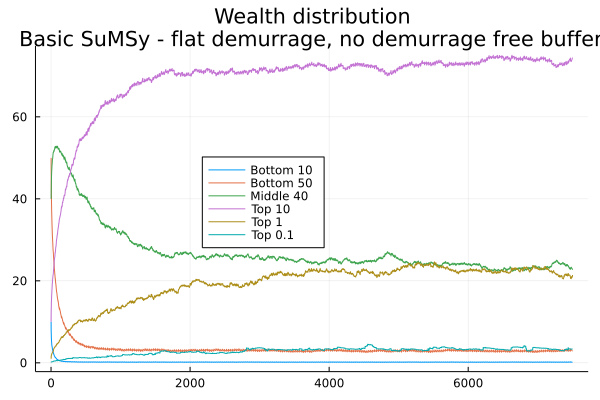

In [13]:
sumsy = SuMSy(2000, 0, 0.01, 30)
df = run_sumsy_simulation(sumsy, sim_length = 250)
dfa = analyse_wealth(df)
plot_wealth(dfa, "Basic SuMSy - flat demurrage, no demurrage free buffer")

Slow economies only execute 50 transactions per cycle instead of 200.

In [ ]:
df = run_sumsy_simulation(sumsy, num_transactions = 50, sim_length = 250)
dfa = analyse_wealth(df)
plot_wealth(dfa, "Basic SuMSy - slow economy")

Transaction based SuMSy charges partial demurrage at each transaction and every 30 cycles. It also deposits partial GI at each transaction and every 30 cycles. Both demurrage and GI are calculated over the period since the last previous transaction.

In [ ]:
granular_sumsy = SuMSy(2000, 0, 0.01, 30, interval = 1, sim_length = 250)
df = run_sumsy_simulation(granular_sumsy)
dfa = analyse_wealth(df)
plot_wealth(dfa, "Granular based SuMSy")

In [ ]:
df = run_sumsy_simulation(granular_sumsy, num_transactions = 50, sim_length = 250)
dfa = analyse_wealth(df)
plot_wealth(dfa, "Granular based SuMSy - slow economy")

In [ ]:
dem_free_sumsy = SuMSy(2000, 50000, 0.01, 30)
df = run_sumsy_simulation(dem_free_sumsy, sim_length = 250)
dfa = analyse_wealth(df)
plot_wealth(dfa, "Demurrage free buffer")

In [ ]:
tiers = [(0, 0.01), (50000, 0.02), (500000, 0.05), (1000000, 0.1), (10000000, 0.5), (50000000, 0.95)]
tiered_sumsy = SuMSy(2000, 0, tiers, 30)
df = run_sumsy_simulation(tiered_sumsy, sim_length = 250)
dfa = analyse_wealth(df)
plot_wealth(dfa, "Tiered SuMSy")

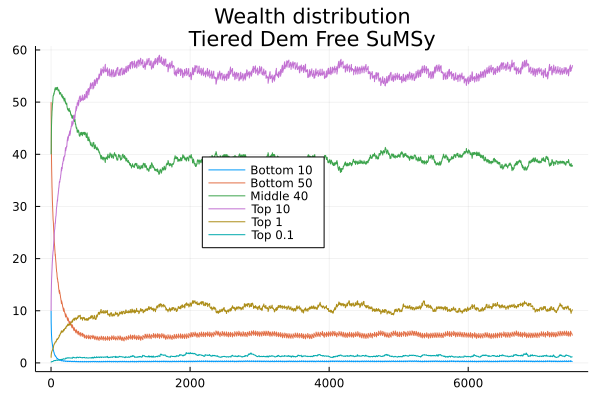

In [4]:
tiers = [(0, 0.01), (50000, 0.02), (500000, 0.05), (1000000, 0.1), (10000000, 0.5), (50000000, 0.95)]
tiered_dem_free_sumsy = SuMSy(2000, 50000, tiers, 30)
df = run_sumsy_simulation(tiered_dem_free_sumsy, sim_length = 250)
dfa = analyse_wealth(df)
plot_wealth(dfa, "Tiered Dem Free SuMSy")

In [5]:
GI = 2000
d = 0.01
tu = 30
basic_model = SuMSy(GI, 0, d, tu)

N_gi = 1000
Y = 200
L = 250


250

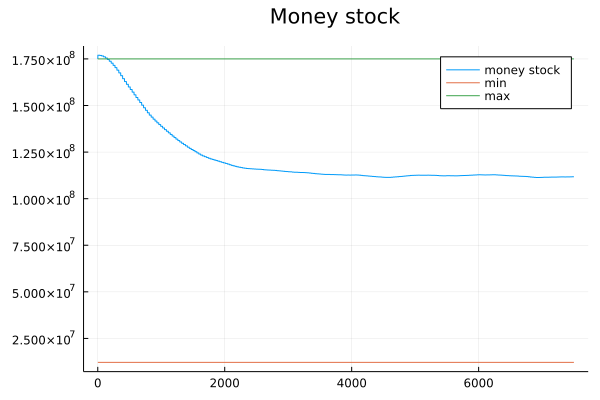

In [6]:

tiers = [(0, 0.01), (50000, 0.02), (500000, 0.05), (1000000, 0.1), (10000000, 0.5), (50000000, 0.95)]
tiered_dem_free_sumsy = SuMSy(2000, 50000, tiers, 30)

plot_money_stock(
    analyse_money_stock(
        run_sumsy_simulation(tiered_dem_free_sumsy,
                            sim_length = 250)),
    theoretical_min = telo(GI * N_gi, 0, tiers),
    theoretical_max = telo(tiered_dem_free_sumsy) * N_gi)

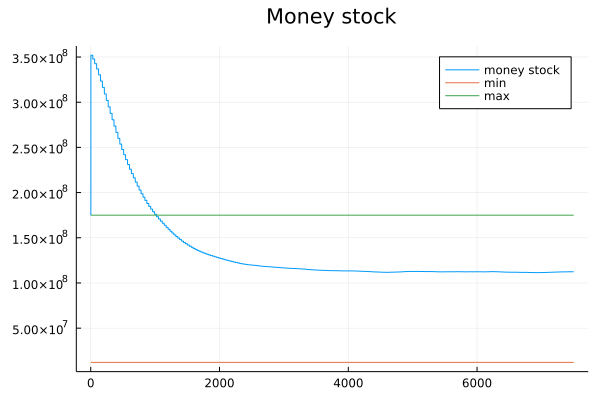

In [7]:
plot_money_stock(
    analyse_money_stock(
        run_sumsy_simulation(tiered_dem_free_sumsy,
                            num_actors = N_gi,
                            num_transactions = Y,
                            sim_length = L,
                            concentrated = false,
                            model_adaptation = one_time_money_injection!)),
    theoretical_min = telo(GI * N_gi, 0, tiers),
    theoretical_max = telo(tiered_dem_free_sumsy) * N_gi)

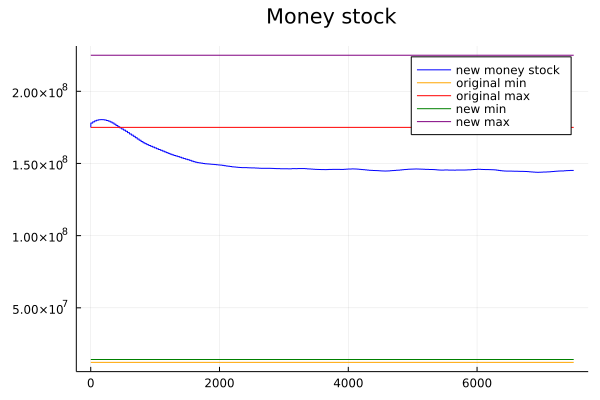

In [8]:
plot_comparative_money_stock(
    analyse_money_stock(
        run_sumsy_simulation(tiered_dem_free_sumsy,
                            num_actors = N_gi,
                            num_transactions = Y,
                            sim_length = L,
                            concentrated = false,
                            model_adaptation = constant_money_injection!)),
    original_min = telo(GI * N_gi, 50000, tiers),
    original_max = telo(tiered_dem_free_sumsy) * N_gi,
    new_min = telo(GI * 1.5 * N_gi, 50000, tiers),
    new_max = telo(GI * 1.5, 50000, tiers) * N_gi)

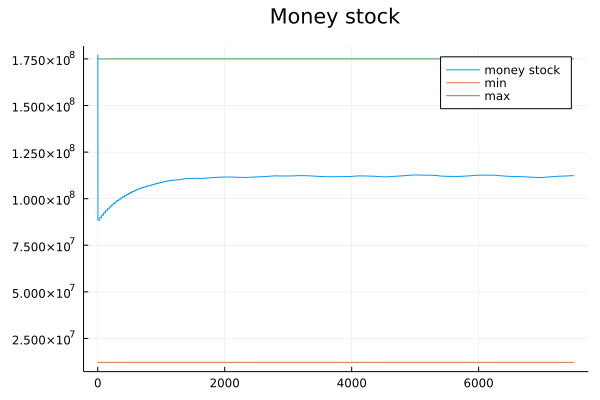

In [9]:
plot_money_stock(
    analyse_money_stock(
        run_sumsy_simulation(tiered_dem_free_sumsy,
                            num_actors = N_gi,
                            num_transactions = Y,
                            sim_length = L,
                            concentrated = false,
                            model_adaptation = one_time_money_destruction!)),
    theoretical_min = telo(GI * N_gi, 0, tiers),
    theoretical_max = telo(tiered_dem_free_sumsy) * N_gi)

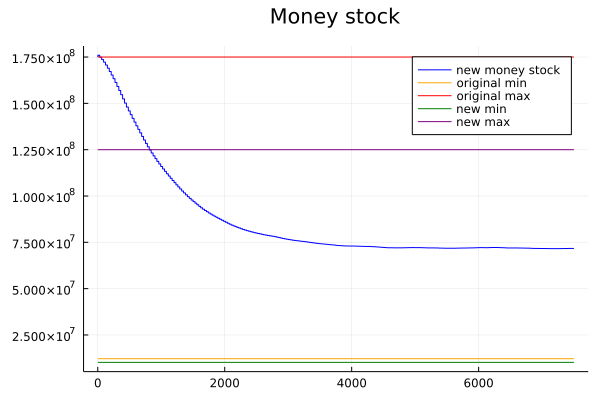

In [10]:
plot_comparative_money_stock(
    analyse_money_stock(
        run_sumsy_simulation(tiered_dem_free_sumsy,
                            num_actors = N_gi,
                            num_transactions = Y,
                            sim_length = L,
                            concentrated = false,
                            model_adaptation = constant_money_destruction!)),
    original_min = telo(GI * N_gi, 50000, tiers),
    original_max = telo(tiered_dem_free_sumsy) * N_gi,
    new_min = telo(GI * 0.5 * N_gi, 50000, tiers),
    new_max = telo(GI * 0.5, 50000, tiers) * N_gi)

For comparison, a demurrage free version is simulated. Instead of demurrage, a flat tax on each transaction is enforced. This tax is removed from the money stock in order to counter the inflation of the money stock. This would be roughly the equivalent of distributing a GI to everyone in the current monetary system.

In [4]:
no_dem_sumsy = SuMSy(2000, 0, 0, 30)
df = run_sumsy_simulation(no_dem_sumsy, sim_length = 5000, transaction_model = taxed_yard_sale!)
dfa = analyse_wealth(df)
plot_wealth(dfa, "UBI + taxes")

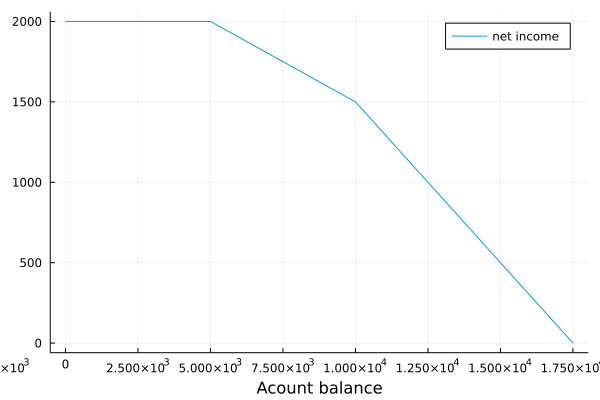

In [3]:
tiers = [(0, 0.01), (50000, 0.02), (500000, 0.05), (1000000, 0.1), (10000000, 0.5), (50000000, 0.95)]
tiered_dem_free_sumsy = SuMSy(2000, 50000, tiers, 30)
plot_net_incomes(tiered_dem_free_sumsy)

Contact this person when draft is done: https://www.quantamagazine.org/rediet-abebe-tackles-inequality-with-computer-science-20210401/